In [144]:
import altair as alt
import pandas as pd
import numpy as np
alt.renderers.enable('mimetype')

RendererRegistry.enable('mimetype')

In [145]:
url = "https://open.canada.ca/data/dataset/92984c11-6fd4-40c4-b23c-e8832e1f4cd5/resource/148841f0-11c9-4f45-8700-d0a4717dea2f/download/capf_en.csv"
heritage = pd.read_csv(url, encoding="ISO-8859-1")

# some data cleaning
heritage.columns = heritage.columns.str.lower().str.replace(" ", "_")
heritage = heritage.rename(columns={"grant_or_contributionution": "grant_or_contribution"})
heritage["audiences"] = heritage["audiences"].str.split(", ", expand=False)
heritage["disciplines"] = heritage["disciplines"].str.split(", ", expand=False)

In [146]:
heritage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1358 entries, 0 to 1357
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   fiscal_year            1358 non-null   object
 1   organization_name      1358 non-null   object
 2   project_name           1358 non-null   object
 3   city                   1358 non-null   object
 4   province               1358 non-null   object
 5   region                 1358 non-null   object
 6   community_type         1358 non-null   object
 7   grant_or_contribution  1358 non-null   object
 8   amount_approved        1358 non-null   int64 
 9   presenter_type         1358 non-null   object
 10  disciplines            1358 non-null   object
 11  audiences              1358 non-null   object
 12  project_sub_type       1358 non-null   object
 13  project_type           1358 non-null   object
dtypes: int64(1), object(13)
memory usage: 148.7+ KB


In [147]:
q10 = heritage["amount_approved"].quantile(0.1)
q25 = heritage["amount_approved"].quantile(0.25)
q50 = heritage["amount_approved"].quantile(0.5)
q75 = heritage["amount_approved"].quantile(0.75)

labeling = [f"${q75/1000}K",
            f"${q50/1000}K",
            f"${q25/1000}K",
            f"${q10/1000}K",
            f"less than ${q10/1000}K"]

amount = heritage["amount_approved"]
heritage["greater_than"] = np.where(amount > q75, labeling[0],
                                                 np.where(amount > q50, labeling[1],
                                                         np.where(amount > q25, labeling[2],
                                                                 np.where(amount > q10, labeling[3], labeling[4]))))

heritage = heritage.explode("audiences").explode("disciplines")

#### Ammount approved

In [148]:
heritage["amount_approved"].sort_values().unique()

array([   3000,    3300,    3500,    3600,    4000,    4500,    4850,
          5000,    5500,    5600,    6000,    6500,    7000,    7100,
          7500,    8000,    8500,    9000,    9500,   10000,   10500,
         11000,   12000,   12500,   13000,   13300,   13500,   14000,
         14390,   14500,   15000,   15500,   16000,   16500,   16671,
         17000,   17500,   18000,   18555,   19000,   20000,   20600,
         21000,   21250,   22000,   22500,   23000,   24000,   25000,
         25200,   26000,   26500,   27000,   27500,   28000,   29500,
         30000,   31000,   32000,   32500,   33000,   34000,   35000,
         36000,   37000,   37500,   38000,   38350,   40000,   40112,
         41000,   42000,   43000,   43500,   45000,   47000,   47500,
         48000,   49000,   49500,   50000,   52000,   53000,   55000,
         57000,   57500,   60000,   62000,   62500,   63000,   65000,
         66300,   68000,   70000,   71690,   72000,   72500,   73000,
         75000,   76

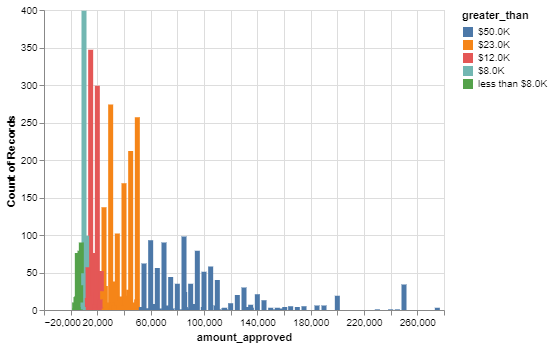

In [149]:
eda_heritage = (
    alt.Chart(heritage).mark_bar(clip=True).encode(
        alt.X("amount_approved", scale=alt.Scale(domain=(0, 260000))),
        alt.Y("count()"),
        alt.Color("greater_than", sort=labeling))
)
eda_heritage

#### Counts of features

In [150]:
columns_eda = ['fiscal_year',
               'province',
               'region',
               'community_type',
               'grant_or_contribution',
               'presenter_type',
               'disciplines',
               'audiences',
               'project_sub_type',
               'project_type']

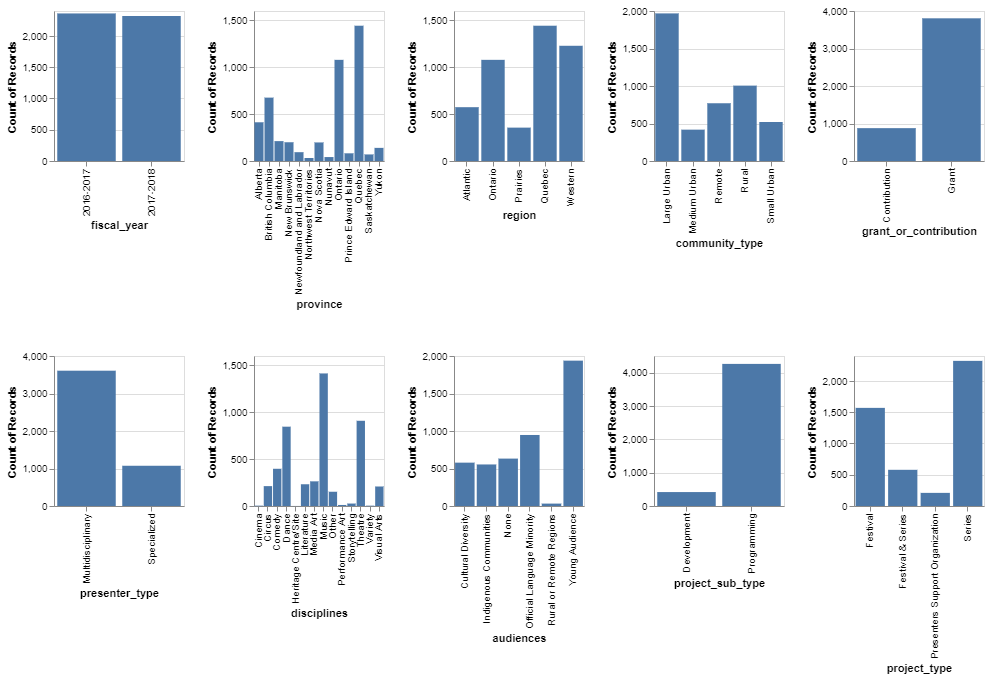

In [151]:
eda = (
    alt.Chart(heritage).mark_bar().encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("count()", stack=False),)
    .properties(width=130, height=150)
    .repeat(columns_eda, columns=5)
)
eda

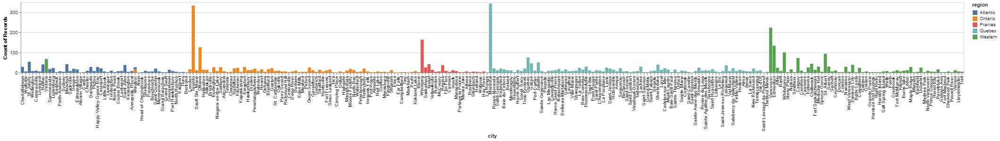

In [152]:
eda_city = (
    alt.Chart(heritage).mark_bar().encode(
        alt.X("city", sort="color"),
        alt.Y("count()"),
        alt.Color("region"))
    .properties(width=2000, height=150)
)
eda_city

#### Features vs amount_approved

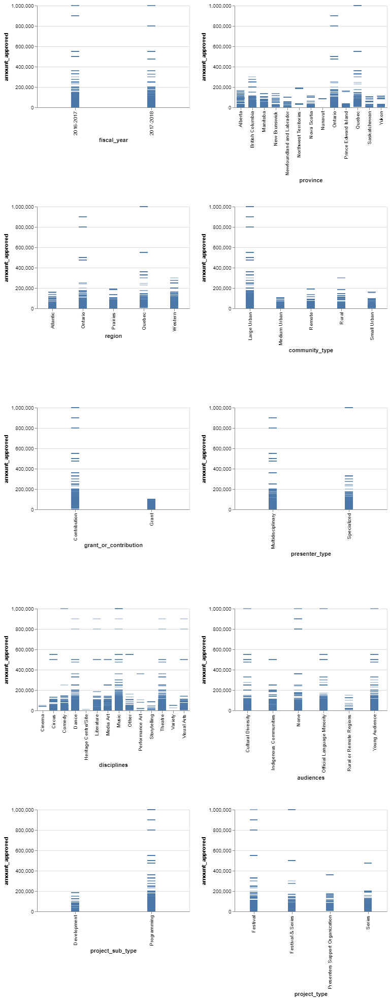

In [153]:
eda_num = (
    alt.Chart(heritage).mark_tick(width=15).encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("amount_approved"),)
    .properties(width=300, height=200)
    .repeat(columns_eda, columns=2)
)
eda_num

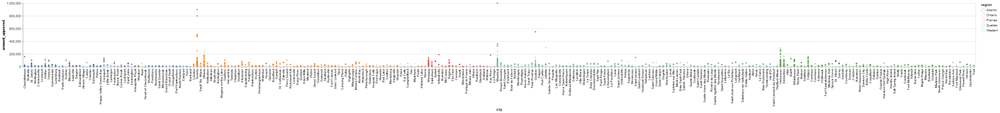

In [154]:
eda_city = (
    alt.Chart(heritage).mark_point(size=7, opacity=0.3).encode(
        alt.X("city", sort="color"),
        alt.Y("amount_approved"),
        alt.Color("region"))
    .properties(width=3000, height=200)
)
eda_city

#### Feature counts with amount_approved categories

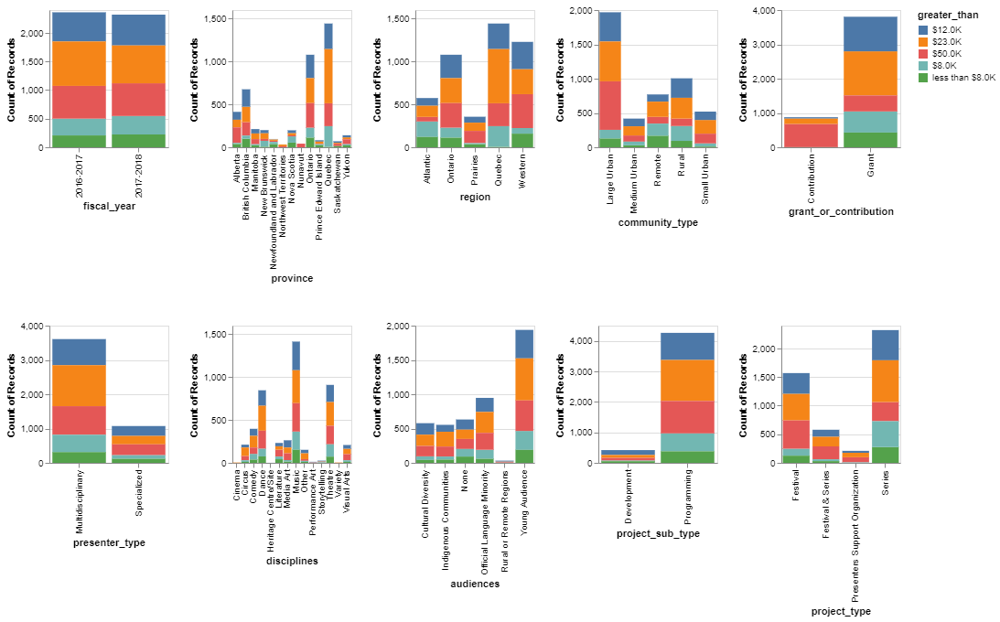

In [155]:
eda3 = (
    alt.Chart(heritage).mark_bar().encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("count()"),
        alt.Color("greater_than"))
    .properties(width=130, height=150)
    .repeat(columns_eda, columns=5)
)
eda3

In [156]:
provinces = ['British Columbia', 'Alberta', 'Saskatchewan', 'Manitoba',
             'Ontario', 'Quebec', 'Newfoundland and Labrador', 'New Brunswick',
             'Nova Scotia', 'Prince Edward Island', 'Yukon',
             'Northwest Territories', 'Nunavut']